In [1]:
from pylab import rcParams
rcParams['figure.figsize'] = 10, 20

In [2]:
import imageio
import matplotlib.pyplot as plt
im = imageio.imread("../input/tcia-chest-ct-sample/chest-220.dcm")

In [3]:
print("Type of image {}".format(type(im)))
print("shape of image {}".format(type(im.shape)))

Type of image <class 'imageio.core.util.Array'>
shape of image <class 'tuple'>


(-0.5, 511.5, 511.5, -0.5)

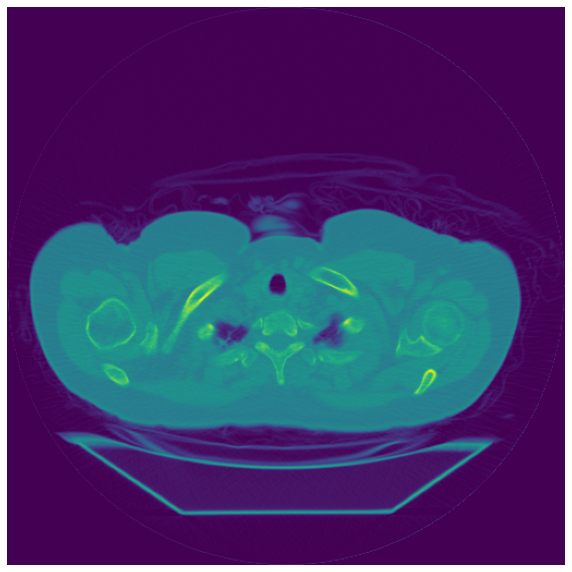

In [4]:
plt.imshow(im)
plt.axis("off")

In [5]:
print(im.meta.keys())
print("----------------------------------")
print(im.meta)

odict_keys(['TransferSyntaxUID', 'SOPClassUID', 'SOPInstanceUID', 'StudyDate', 'SeriesDate', 'ContentDate', 'StudyTime', 'SeriesTime', 'ContentTime', 'Modality', 'Manufacturer', 'StudyDescription', 'SeriesDescription', 'PatientName', 'PatientID', 'PatientBirthDate', 'PatientSex', 'PatientWeight', 'StudyInstanceUID', 'SeriesInstanceUID', 'SeriesNumber', 'AcquisitionNumber', 'InstanceNumber', 'ImagePositionPatient', 'ImageOrientationPatient', 'SamplesPerPixel', 'Rows', 'Columns', 'PixelSpacing', 'BitsAllocated', 'BitsStored', 'HighBit', 'PixelRepresentation', 'RescaleIntercept', 'RescaleSlope', 'PixelData', 'shape', 'sampling'])
----------------------------------
Dict([('TransferSyntaxUID', '1.2.840.10008.1.2'), ('SOPClassUID', '1.2.840.10008.5.1.4.1.1.2'), ('SOPInstanceUID', '1.3.6.1.4.1.14519.5.2.1.5168.1900.290866807370146801046392918286'), ('StudyDate', '20040529'), ('SeriesDate', '20040515'), ('ContentDate', '20040515'), ('StudyTime', '115208'), ('SeriesTime', '115254'), ('ContentTi

Type of the image <class 'imageio.core.util.Array'>
Shape of the image (512, 512)


(-0.5, 511.5, 511.5, -0.5)

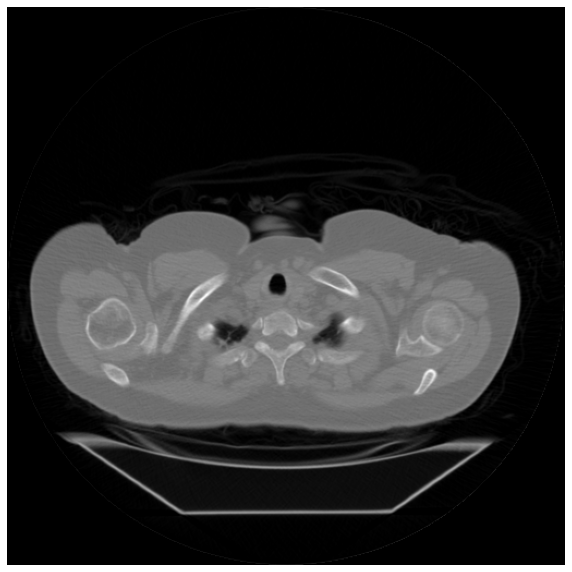

In [6]:
print("Type of the image {}".format(type(im)))
print("Shape of the image {}".format(im.shape))
plt.imshow(im,cmap='gray')
plt.axis("off")

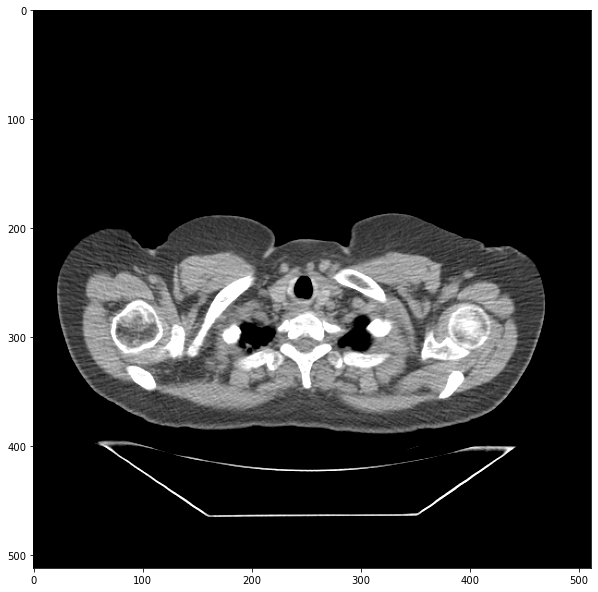

In [7]:
plt.imshow(im,cmap = "gray",vmin=-200,vmax=200)
plt.show()

In [8]:
### create a 3d image 
import imageio
import numpy as np

# Read in each 2D image
im1 = imageio.imread('../input/tcia-chest-ct-sample/chest-220.dcm')
im2 = imageio.imread('../input/tcia-chest-ct-sample/chest-221.dcm')
im3 = imageio.imread('../input/tcia-chest-ct-sample/chest-222.dcm')

# Stack images into a volume
vol = np.stack([im1,im2,im3])
print('Volume dimensions:', vol.shape)

Volume dimensions: (3, 512, 512)


In [9]:
## we can directly load a image folder
import imageio
vol = imageio.volread("../input/tcia-chest-ct-sample/")
print("Avilable metadata: {} ".format(vol.meta.keys()))
print("Shape of the image Array: {} ".format(vol.shape))

Reading DICOM (examining files): 1/5 files (20.0%)5/5 files (100.0%)
  Found 1 correct series.
Reading DICOM (loading data): 5/5  (100.0%)
Avilable metadata: odict_keys(['TransferSyntaxUID', 'SOPClassUID', 'SOPInstanceUID', 'StudyDate', 'SeriesDate', 'ContentDate', 'StudyTime', 'SeriesTime', 'ContentTime', 'Modality', 'Manufacturer', 'StudyDescription', 'SeriesDescription', 'PatientName', 'PatientID', 'PatientBirthDate', 'PatientSex', 'PatientWeight', 'StudyInstanceUID', 'SeriesInstanceUID', 'SeriesNumber', 'AcquisitionNumber', 'InstanceNumber', 'ImagePositionPatient', 'ImageOrientationPatient', 'SamplesPerPixel', 'Rows', 'Columns', 'PixelSpacing', 'BitsAllocated', 'BitsStored', 'HighBit', 'PixelRepresentation', 'RescaleIntercept', 'RescaleSlope', 'PixelData', 'shape', 'sampling']) 
Shape of the image Array: (5, 512, 512) 


In [10]:
print(vol.shape)

(5, 512, 512)


In [11]:
#image shape: number of element on each axis
n0,n1,n2 = vol.shape 
#sampling rate : physical space covered by each sample
d0,d1,d2 = vol.meta['sampling'] 
# field of view : physical space covered along each axis
print("Physical space covered by each axis")
print(n0*d0,n1*d1,n2*d2)

Physical space covered by each axis
16.34999999999998 499.999744 499.999744


Reading DICOM (examining files): 1/5 files (20.0%)5/5 files (100.0%)
  Found 1 correct series.
Reading DICOM (loading data): 5/5  (100.0%)


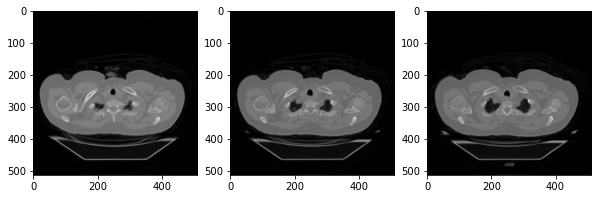

In [12]:
## pltting image with subplot
import imageio
col = imageio.volread("../input/tcia-chest-ct-sample/")
fig,axis = plt.subplots(nrows=1,ncols=3)
axis[0].imshow(vol[0],cmap="gray")
axis[1].imshow(vol[1],cmap="gray")
axis[2].imshow(vol[2],cmap="gray")

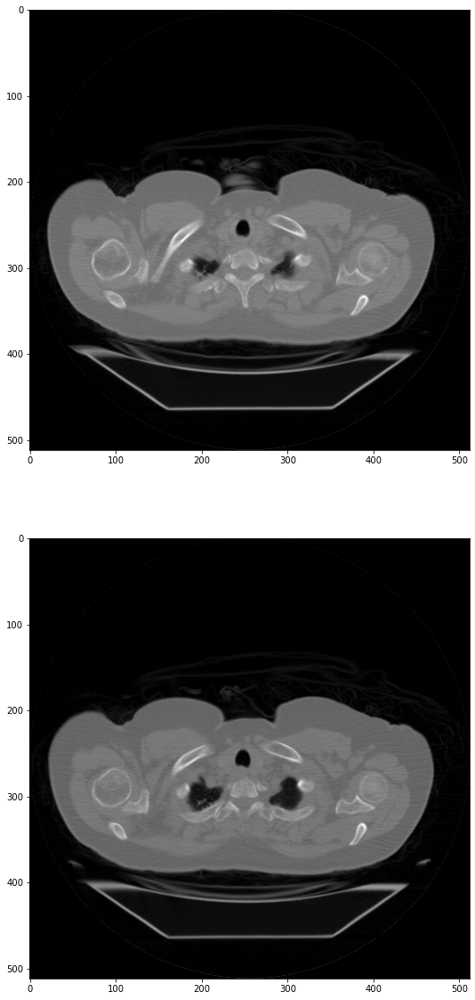

In [13]:
### plotting in row
import matplotlib.pyplot as plt
fig,axis = plt.subplots(nrows=2,ncols=1)
im1 = imageio.imread('../input/tcia-chest-ct-sample/chest-220.dcm')
im2 = imageio.imread('../input/tcia-chest-ct-sample/chest-221.dcm')
axis[0].imshow(im1,cmap="gray")
axis[1].imshow(im2,cmap="gray")
plt.show()

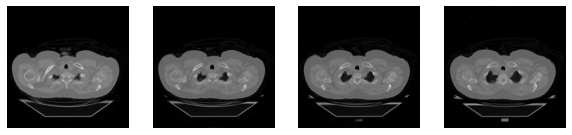

In [14]:
## how tosee the image from different dimension
## first lock one dimension and then 
## take the rest of the data and plot it
fig,axis = plt.subplots(nrows=1,ncols=4)
for dimension in range(4):
    im = vol[dimension,:,:]
    axis[dimension].imshow(im,cmap="gray")
    axis[dimension].axis("off")
plt.show()

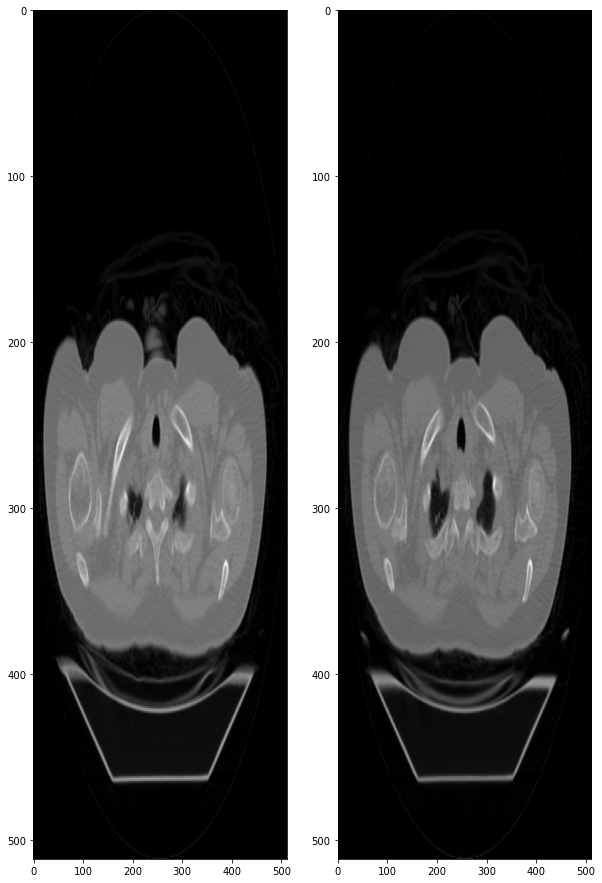

In [15]:
## calculating aspect ratio
d0,d1,d2 = vol.meta['sampling']
asp1 = d0/d1
asp2 = d0/d2

## plot the image with the aspect ratio
fig,axis = plt.subplots(nrows=1,ncols=2)
axis[0].imshow(im1,cmap="gray",aspect = asp1)
axis[1].imshow(im2,cmap="gray",aspect = asp1)

intensity value
you may need to change the intensity
of the image or part of the image 
to understand thhis you need to understand the intensity distribution
and two thing 


*   **pixel** pixel is for 2D element
*   **voxels** voxel is dor the 3D image

and you need to understand two property intensity and location
suppose you are working with the xray of a bode(dense tissue) your data type that is used for image can be a very impotant affet in the memory allocation of the image

In [16]:
import imageio
im = imageio.imread("../input/hand.png")

In [17]:
print(im.dtype)
print(im.size)

uint8
153600


In [18]:
## chaning dtpye and size
im_int64 = im.astype(np.uint64)
print(im_int64.size)

153600


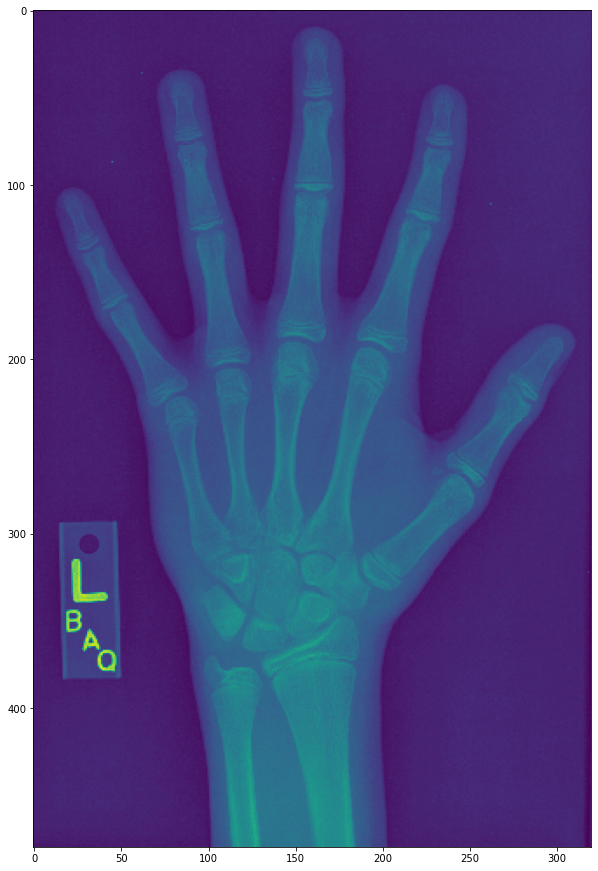

In [19]:
plt.imshow(im)

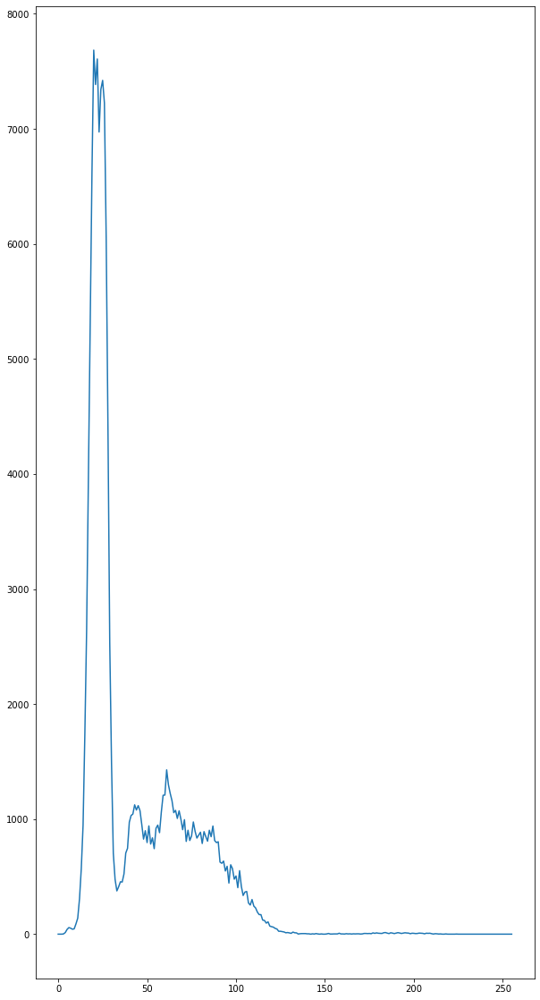

In [20]:
## make a histogram to plot the pixel and the intensity of the value throughout image
import scipy.ndimage as ndi
hist = ndi.histogram(im,min=0,max=255,bins=256)
plt.plot(hist)

(array([189.,  52.,   1.,   2.,   0.,   2.,   1.,   1.,   1.,   7.]),
 array([   0. ,  768.4, 1536.8, 2305.2, 3073.6, 3842. , 4610.4, 5378.8,
        6147.2, 6915.6, 7684. ]),
 <a list of 10 Patch objects>)

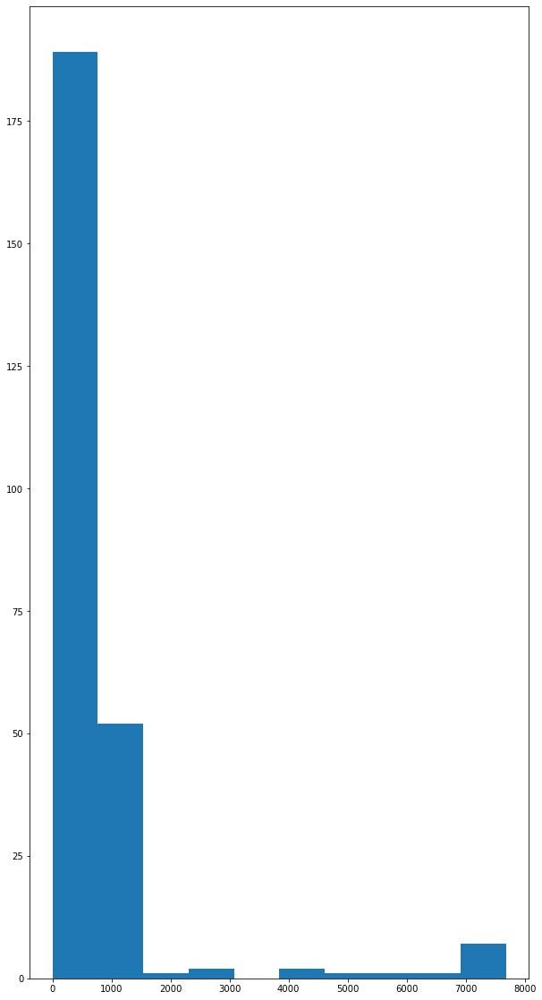

In [21]:
plt.hist(hist)

In [22]:
## thats show that this is a skewed image
## because most of the background is blak and some of the portion (the hand portion)
## is is image take hisger pixel thats why it is a skewed image
## we can redistribute this with the 
## Equalization
## distribution often skewed to the background image in medical image
## but we can redistribute this  intensity to optimize the full intensity length
## you can redistribute this thing with CDF (cumulative distributuion function)
## VDF can show that then range that your image is build in the total pixel range
## so lets redistribute this image

In [23]:
import scipy.ndimage as ndi
hist = ndi.histogram(im,min=0,max=255,bins=256)

## calculate the cdf
## find the cumulative sum and then devie witht eh histogram sum
## to make a cumulative histogram
cdf = hist.cumsum()/hist.sum()
cdf.shape

(256,)

In [24]:
im_equilized = cdf[im]*255

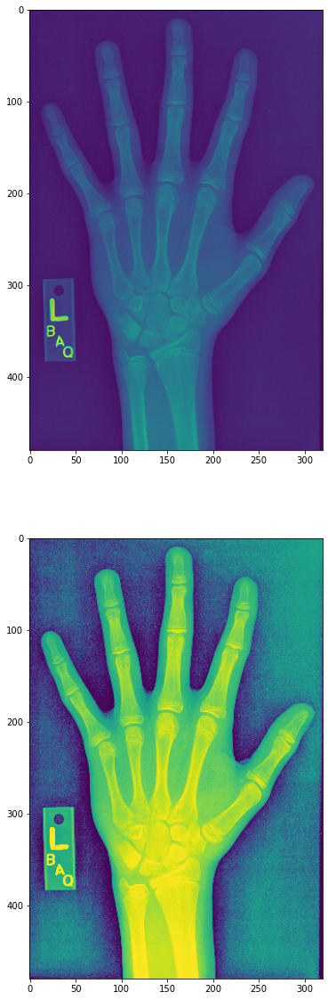

In [25]:
## lets plot the both image
fig,axes = plt.subplots(nrows=2,ncols=1)
axes[0].imshow(im)
axes[1].imshow(im_equilized)

In [26]:
## this is good but you can see that it does the redistribute this image
## but it also brighten up the background of the image

Data type: uint8
Min. value: 3
Max value: 224


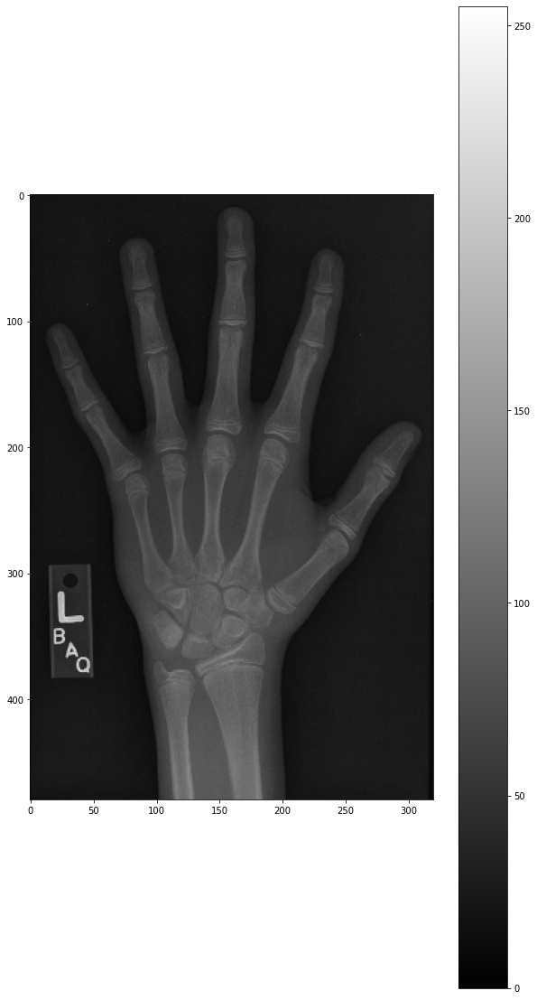

In [27]:
# Load the hand radiograph
im = imageio.imread("../input/hand.png")
print('Data type:', im.dtype)
print('Min. value:', im.min())
print('Max value:', im.max())

# Plot the grayscale image
plt.imshow(im,cmap="gray",vmin=0,vmax=255)
plt.colorbar()

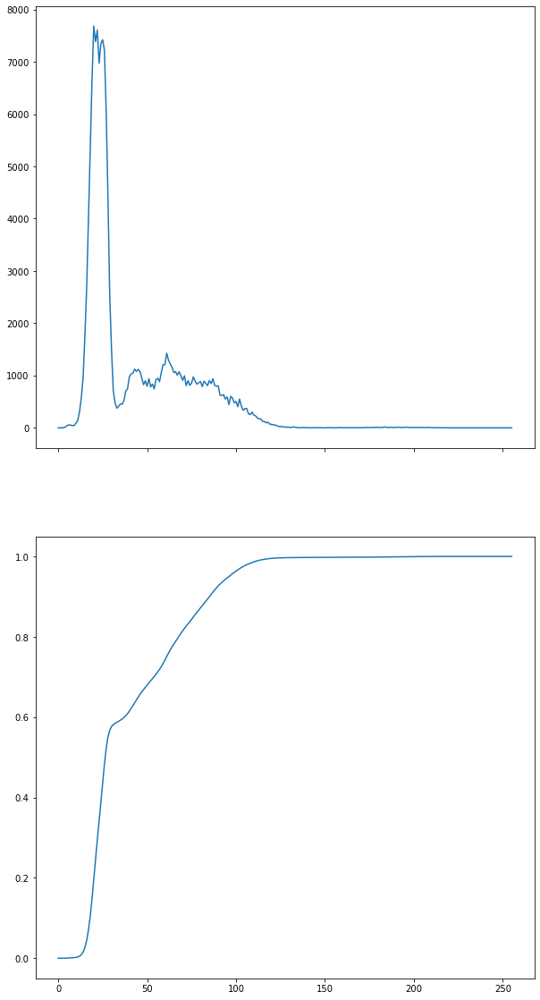

In [28]:
import scipy.ndimage as ndi
hist = ndi.histogram(im,min=0,max=255,bins=256)

## calculate the cdf
## find the cumulative sum and then devie witht eh histogram sum
## to make a cumulative histogram
cdf = hist.cumsum()/hist.sum()
fig, axes = plt.subplots(2, 1, sharex=True)
axes[0].plot(hist, label='Histogram')
axes[1].plot(cdf, label='CDF')

# **MASK** 
using mask you can select the image that you only needed for the processing 
 

In [29]:
## masking image
## if you see the distribution you can see that
## only a part of the pixel have value high
## that means this image is themain feature of theimage 
## so lets extract the image

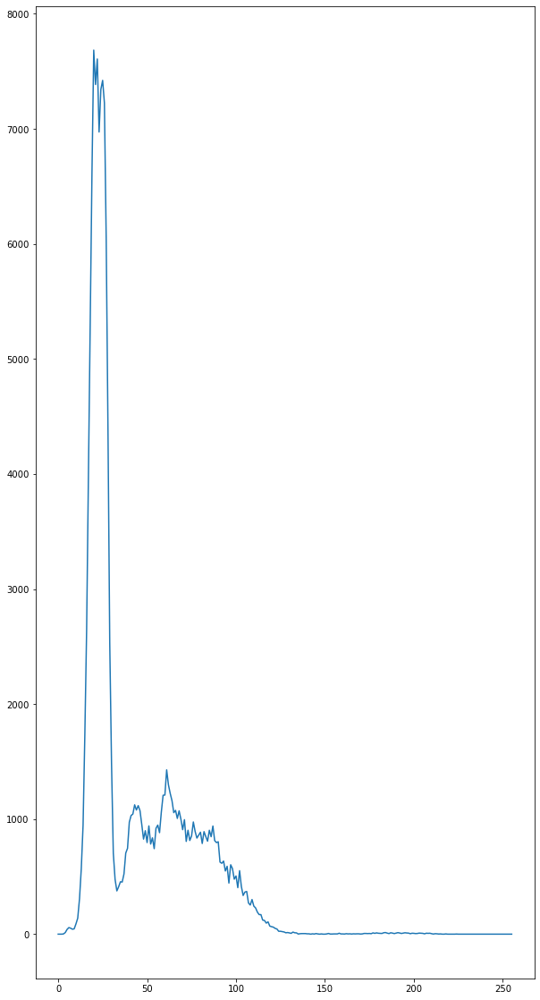

In [30]:
plt.plot(hist)

In [31]:
## so we can see that after 35 (apporx ) the curve went down
## lets filter it down
mask1 = im > 35

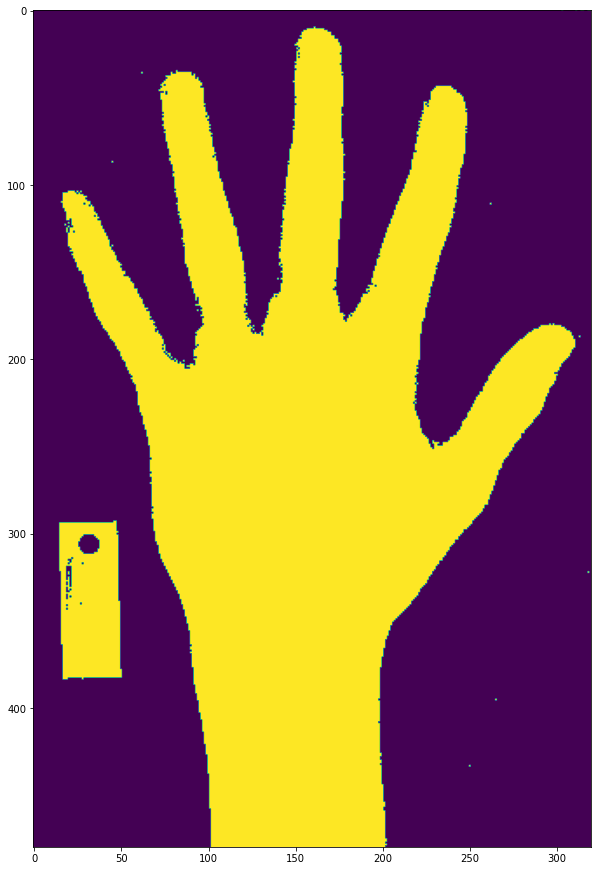

In [32]:
plt.imshow(mask1)

In [33]:
## so you can see we can extract theonlt the hand part
## but the main challange is can we show the bones too ??????
## because bones are the hoghest intensity tissue in an xray

In [34]:
## lets make a narder one 
mask2 = im>70

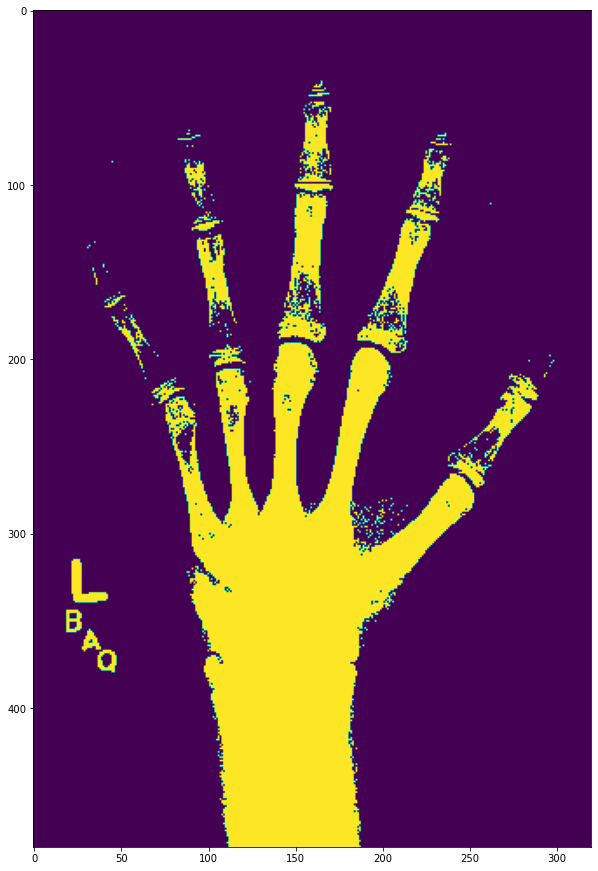

In [35]:
plt.imshow(mask2)

In [36]:
## can you plot both the bone and the tissue

In [37]:
# masking that are in the mask1 but ont in mask2
mask3 = mask1 & ~mask2

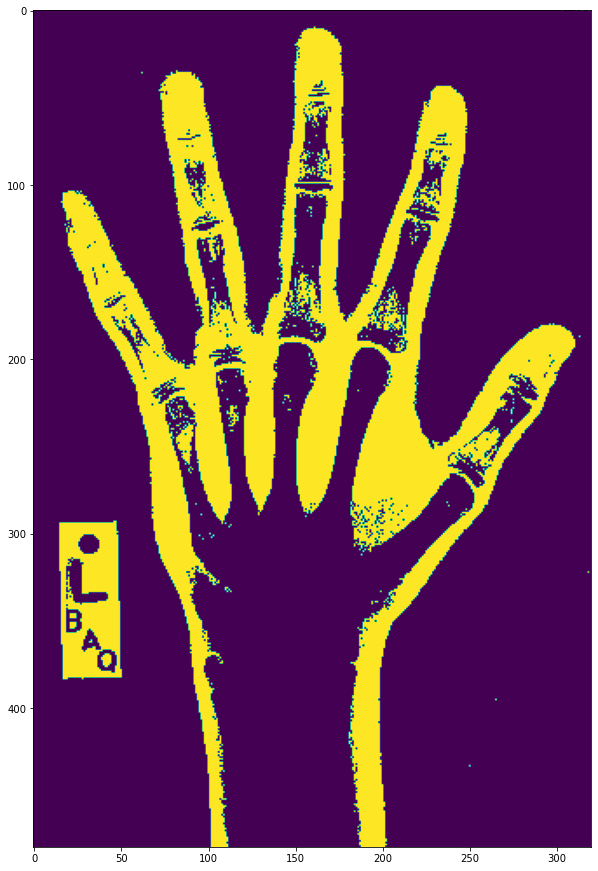

In [38]:
plt.imshow(mask3)

In [39]:
## now you can detect the skin and the bone too

In [40]:
## same work you can do it with numpy too
import numpy as np
im_bone_np = np.where(im>70,im,0)

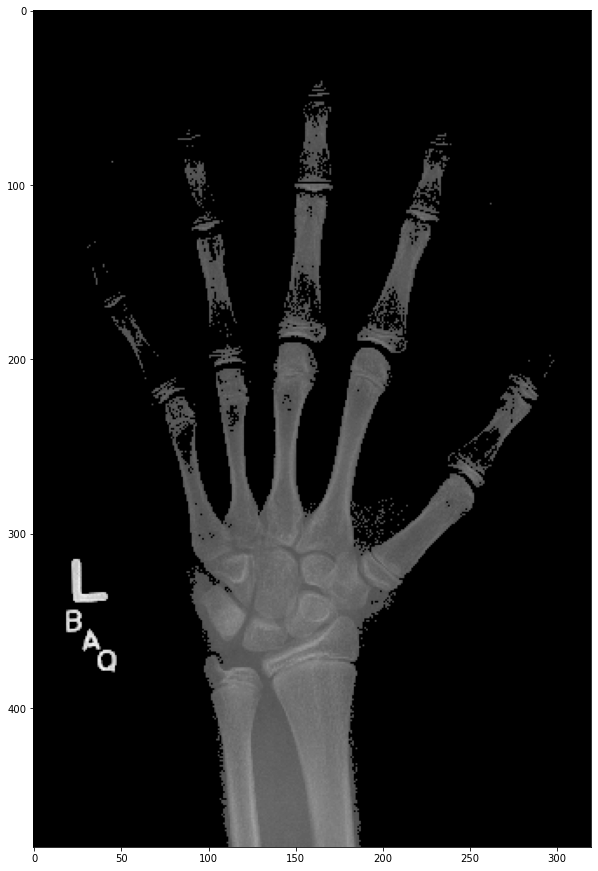

In [41]:
plt.imshow(im_bone_np,cmap="gray")
plt.show()

### dialation is adding pixel to  a image
### this will be done when the image become fuzzy after masking

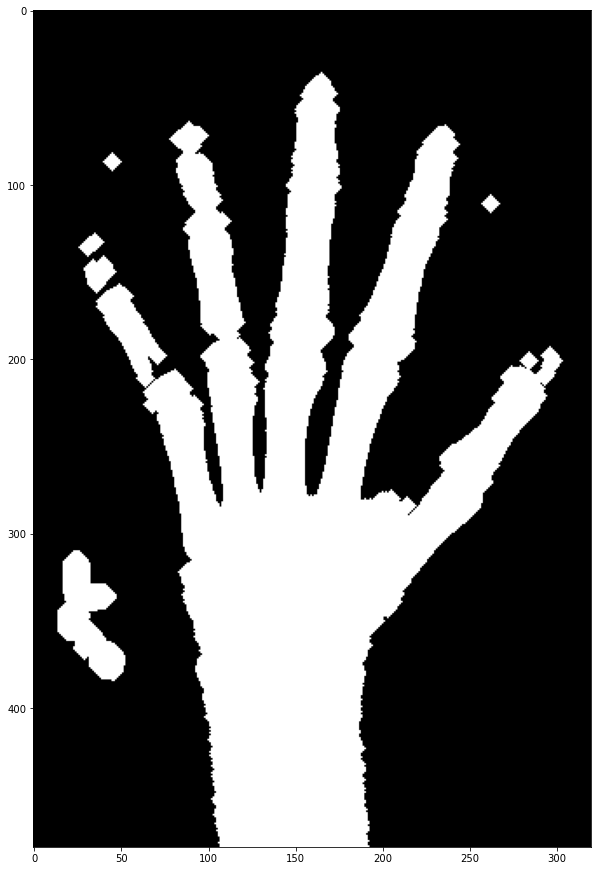

In [42]:
im_bone_np = ndi.binary_dilation(im_bone_np,iterations=5)
plt.imshow(im_bone_np,cmap="gray")
plt.show()

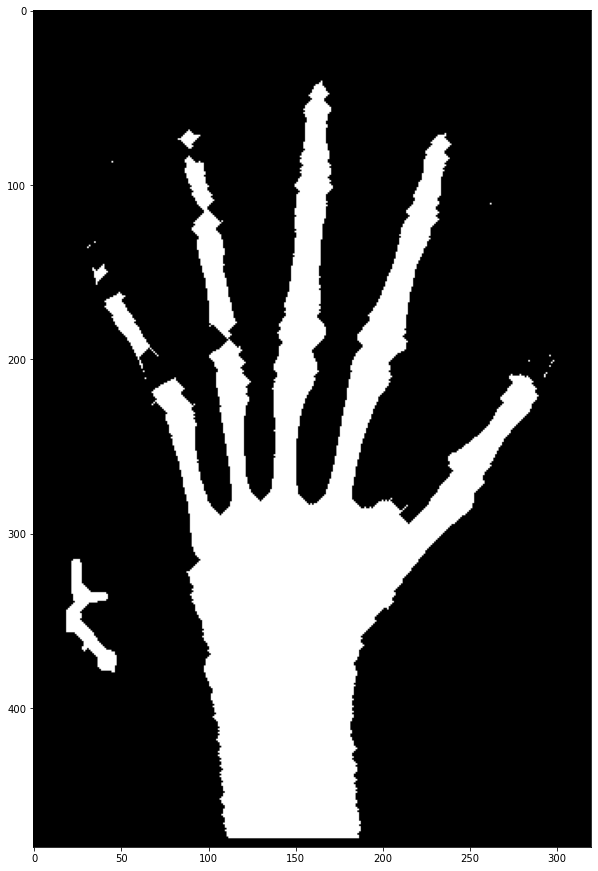

In [43]:
## now you can do the opposite thing that ts pixel erosion
im_bone_np_down = ndi.binary_erosion(im_bone_np,iterations=5)
plt.imshow(im_bone_np_down,cmap="gray")
plt.show()

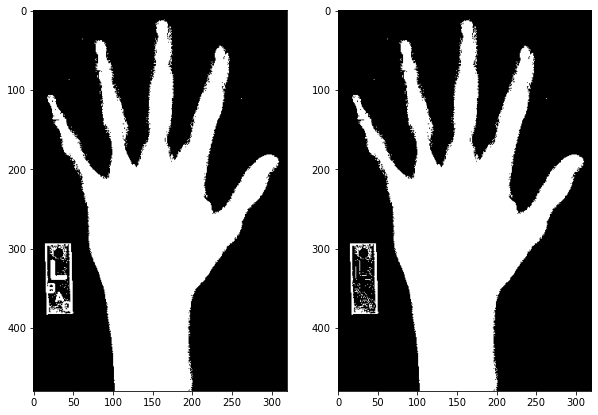

In [44]:
im = imageio.imread("../input/hand.png")
# Create skin and bone masks
mask_bone = im>=45
mask_skin = (im >=45) & (im<=145)

# Plot the skin (0) and bone (1) masks
fig, axes = plt.subplots(1,2)
axes[0].imshow(mask_bone,cmap="gray")
axes[1].imshow(mask_skin,cmap="gray")

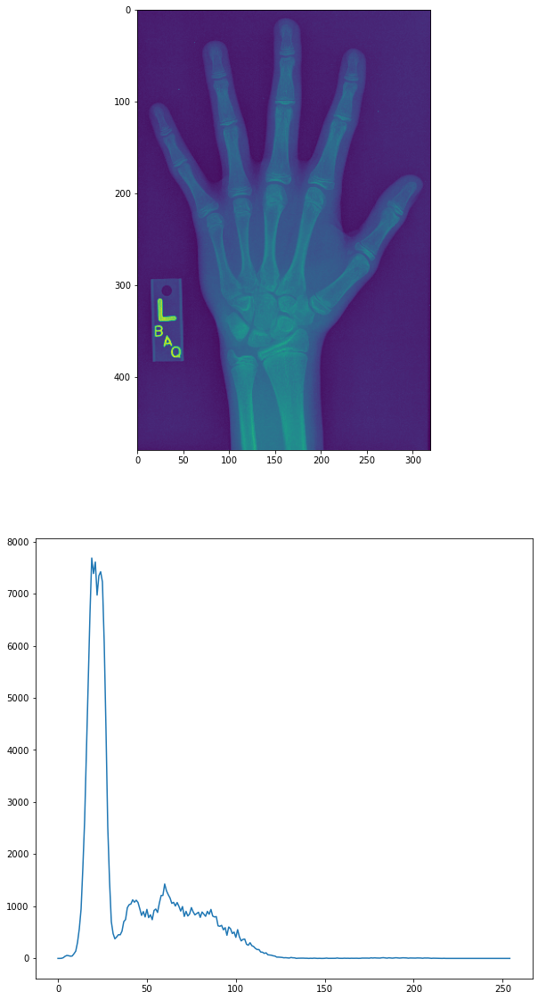

In [45]:
# Import SciPy's "ndimage" module
import scipy.ndimage as ndi
#im_bone_np = np.where(im>70,im,0)
# Screen out non-bone pixels from "im"
mask_bone = im>=145
im_bone = np.where(im>-145, im, 0)

# Get the histogram of bone intensities
hist = ndi.histogram(im_bone,min=1,max=255,bins=255)

# Plot masked image and histogram
fig, axes = plt.subplots(2,1)
axes[0].imshow(im_bone)
axes[1].plot(hist)

In [46]:
# Create and tune bone mask
# mask_bone = im >= 145
# mask_dilate = ndi.binary_dilation(mask_bone, iterations=1)
# mask_closed = ndi.binary_closing(mask_bone, iterations=1)

# Plot masked images
# fig, axes = plt.subplots(1,3)
# axes[0].imshow(mask_bone)
# axes[1].imshow(mask_dilate)
# axes[2].imshow(mask_closed)

# **FILTER**
you can apply convolutional filter


1.   **Smoothing**
2.   **Sharpening**

it apply the convolution just  like we did in the convd layer and it extract the important feature by multiply with weight with that

In [47]:
import imageio
import scipy.ndimage as ndi
im = imageio.imread("../input/hand.png")
## adding weight
##  we emphasize the middle one
weight = [[.11,.11,.11],
          [.11,.12,.11],
          [.11,.11,.11]]
im_fit = ndi.convolve(im,weight)

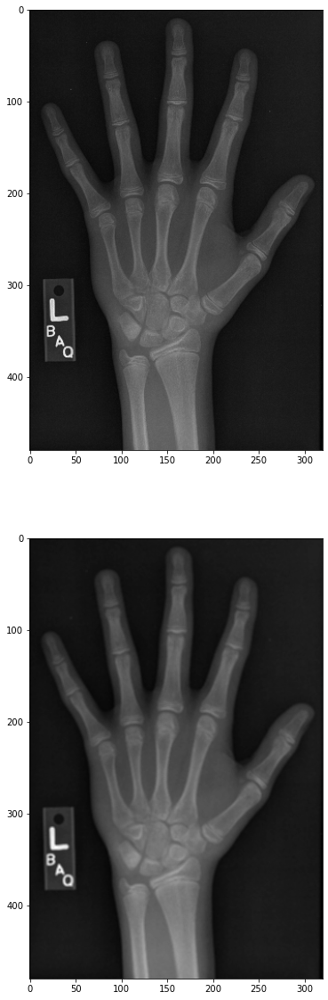

In [48]:
## plot the original and the convolution filter
fig,axes = plt.subplots(2,1)
axes[0].imshow(im,cmap="gray")
axes[1].imshow(im_fit,cmap="gray")

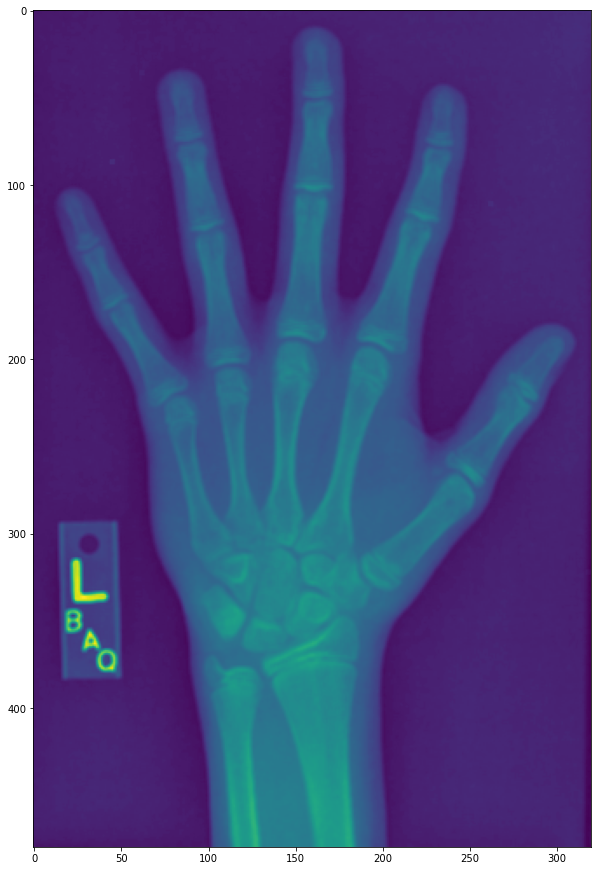

In [49]:
### apply median filter
# apply median filter to the  image
## this is the uniform filter
# Set filter weights
weights = [[0.11, 0.11,.11],
           [0.11, .11, 0.11], 
            [0.11, .11, 0.11]]
im_filt = ndi.convolve(im,weights)
plt.imshow(im_filt)

In [50]:
## smooting image with gaussian filter
## it will smooth the image with reducig the surge of pixel value
# Smooth "im" with Gaussian filters
im_s1 = ndi.gaussian_filter(im, sigma=1)
im_s3 = ndi.gaussian_filter(im, sigma=3)

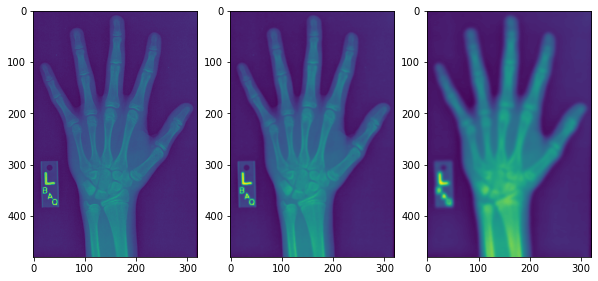

In [51]:
fig, axes = plt.subplots(1,3)
axes[0].imshow( im)
axes[1].imshow(im_s1)
axes[2].imshow(im_s3)

## **Edge Detection**

*   **sobel filter**
*   **sismic colormap**

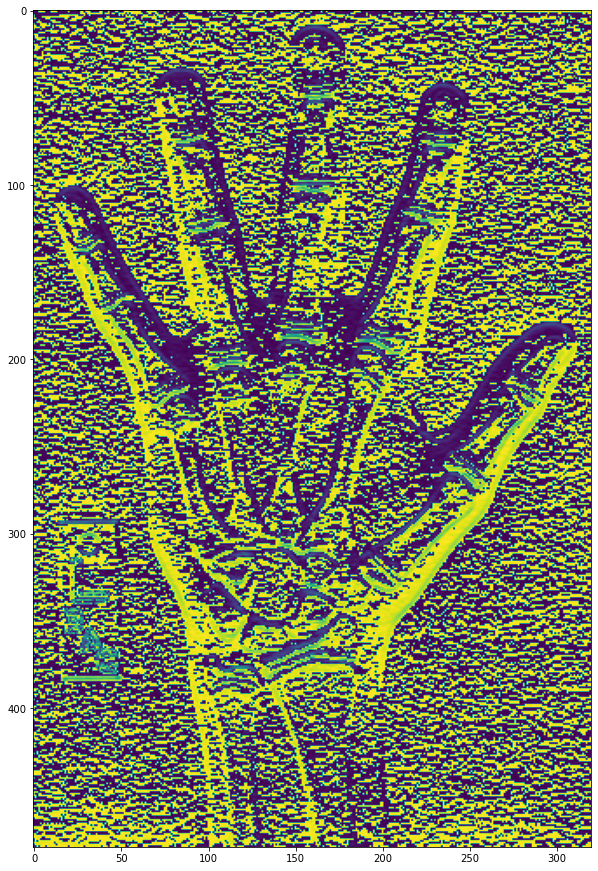

In [52]:
## weight increase at the top and bottom
im = imageio.imread('../input/hand.png')
weights = [[+1,+1,+1],
          [0 ,0 ,0 ],
          [-1,-1,-1]]
edges = ndi.convolve(im,weights)
plt.imshow(edges)

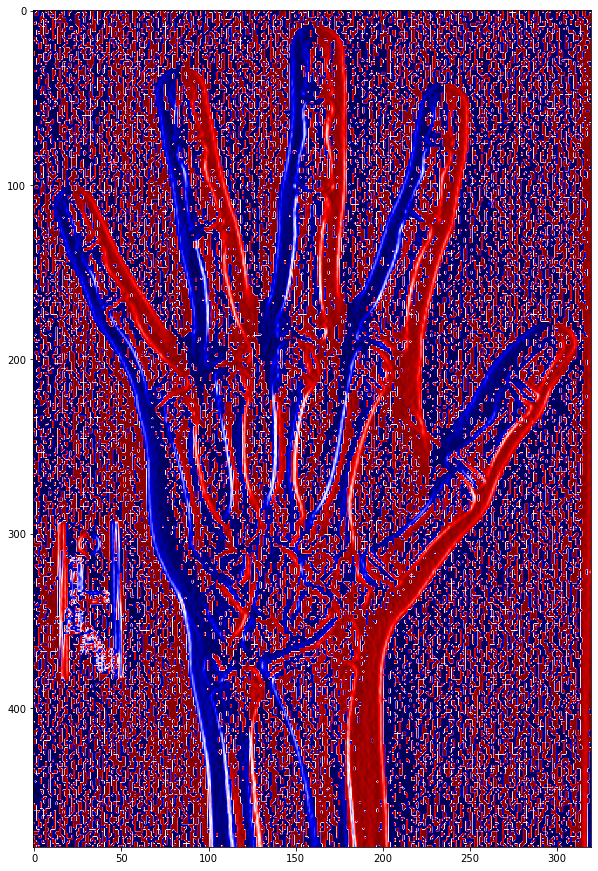

In [53]:
## applying default sovel filter to findn the edge
im = imageio.imread('../input/hand.png')
edges = ndi.sobel(im,axis=1)
plt.imshow(edges,cmap="seismic")

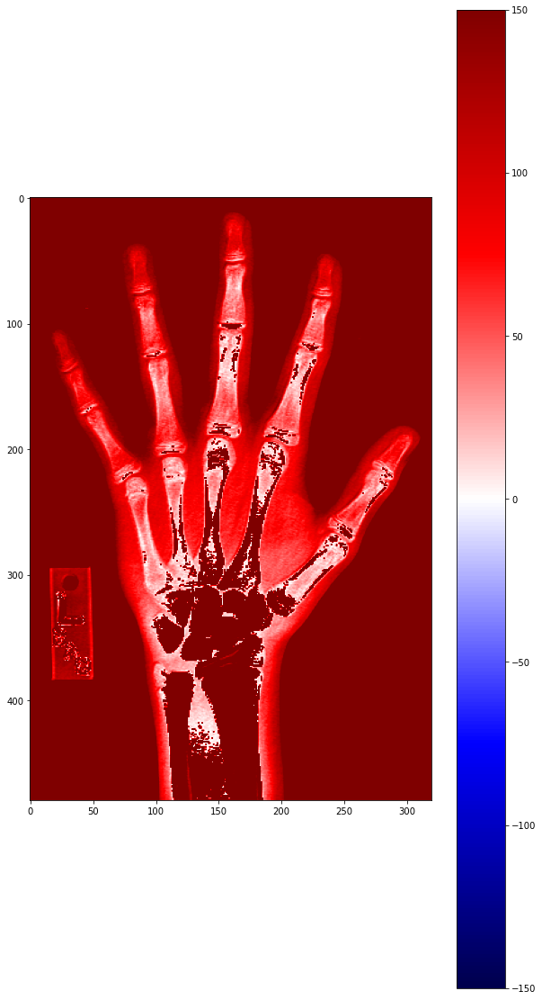

In [54]:
# Set weights to detect vertical edges
weights = [[1,0,-1],
          [0 ,0 ,0 ],
          [-1,-1,-1]]

# Convolve "im" with filter weights
edges = ndi.convolve(im,weights)
plt.imshow(edges,cmap="seismic",vmin=-150,vmax=150)
plt.colorbar()

## Segmentation objects and lebel
## labeling image components

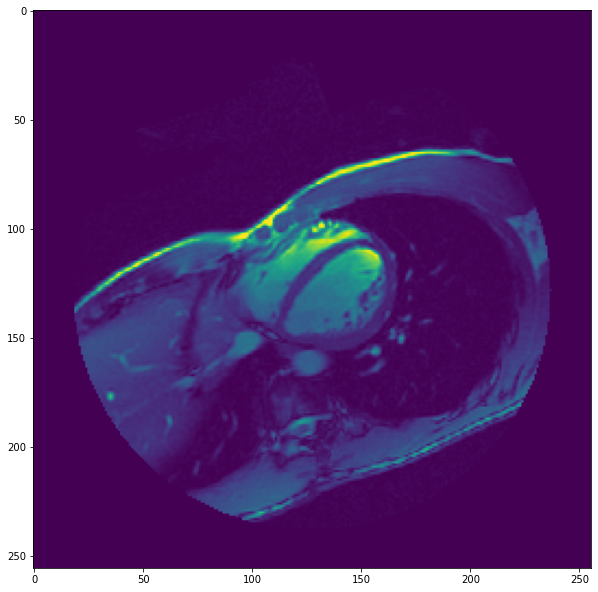

In [55]:
## image of the heart pumping blod we need to extract the left ventricle image
## the one in the circled
im = imageio.imread("../input/sunnybrook-cardiac-mr/SCD2001_006/SCD2001_MR_117.dcm")
plt.imshow(im)

In [56]:
## apply gausian filter to smooth the image
import scipy.ndimage as ndi
filt = ndi.gaussian_filter(im,sigma=2)
## not apply the filter
mask = filt >100


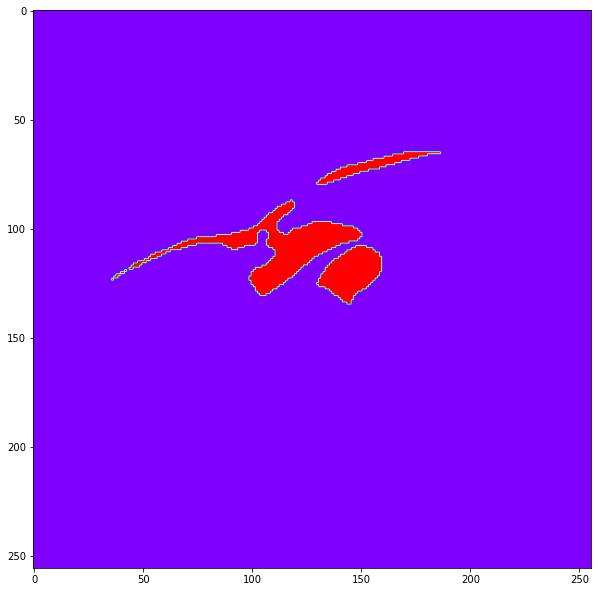

In [57]:
## lets see where we going
plt.imshow(mask,cmap="rainbow")

In [58]:
##extract the label and the number of  the label
labels,nlabels = ndi.label(mask)

In [59]:
print(nlabels)

7


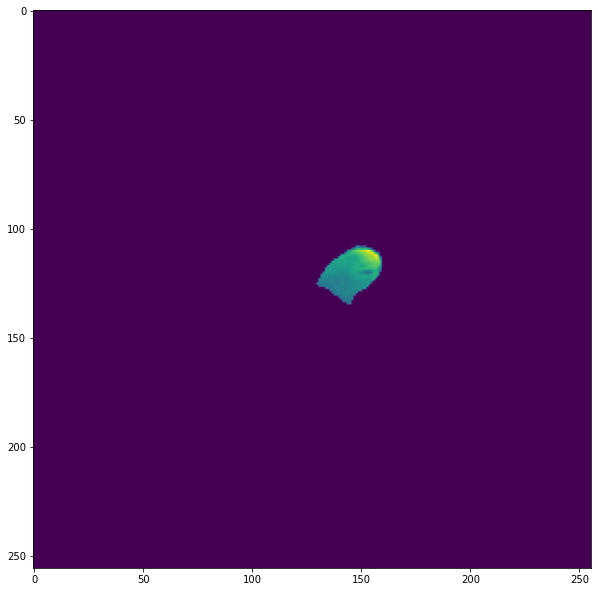

In [60]:
## you can now select individual objects
plt.imshow(np.where(labels==3,im,0))

In [61]:
## ok we got the circullar image
## make  abounding box
## extract objects from the larger image
boxes = ndi.find_objects(labels)

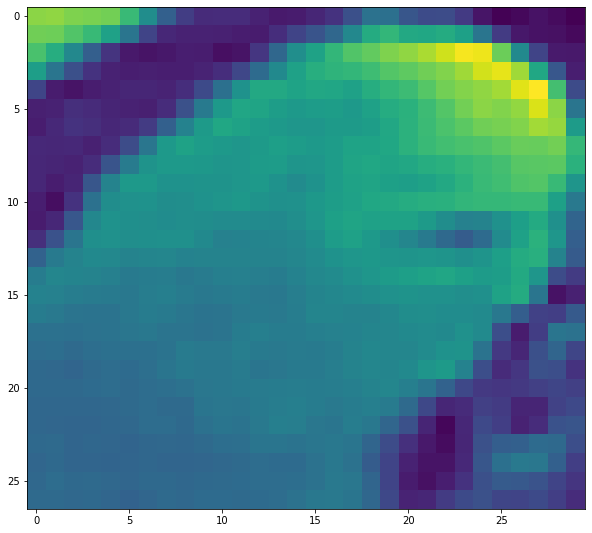

In [62]:
###plotting the box
plt.imshow(im[boxes[2]])


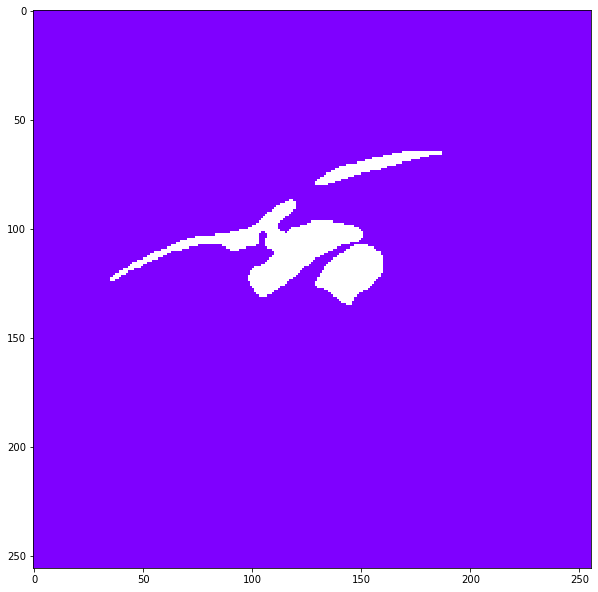

In [63]:
# Label the image "mask"
labels, nlabels = ndi.label(mask)

# Select left ventricle pixels
lv_val = labels[128, 128]
lv_mask = np.where(labels==lv_val,1,np.nan)

# Overlay selected label
plt.imshow(lv_mask, cmap='rainbow')
plt.show()

In [64]:
# Create left ventricle mask
labels, nlabels = ndi.label(mask)
lv_val = labels[128,128]

lv_mask = np.where(labels==lv_val, 1, 0)

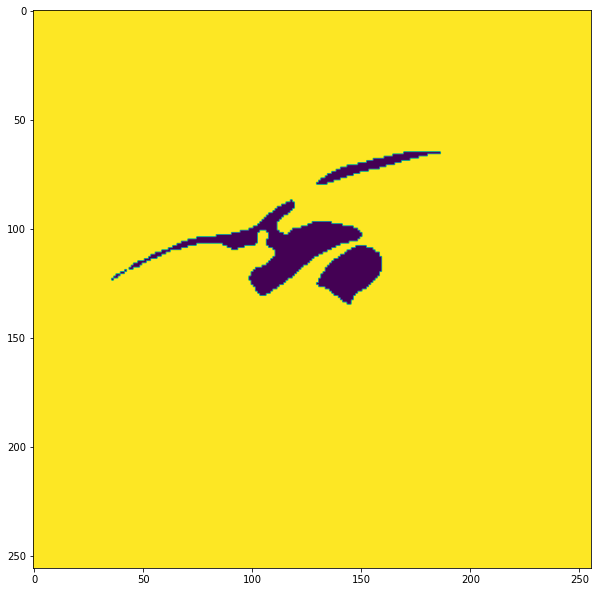

In [65]:
plt.imshow(lv_mask)

# **Measuring Intensity**
## * finding the center of mass
## * finding the volume of the part from the 3D image

In [66]:
## getting a mean intensity of the entire vol 3d image
import imageio
import scipy.ndimage as ndi
vol = imageio.volread('../input/sunnybrook-cardiac-mr/SCD2001_006/')

Reading DICOM (examining files): 1/21 files (4.8%)21/21 files (100.0%)
  Found 1 correct series.
Reading DICOM (loading data): 21/21  (100.0%)


In [67]:
## find the mean of all the pixel
print(ndi.mean(vol))

15.457653227306547


In [68]:
## if you provde a mask this mean will be avilabe for ony the non zero pixel
print(ndi.mean(vol,labels))

140.12914903244697


In [69]:
## you can find for a specfic one
print(ndi.mean(vol,labels,index=1))
print(ndi.mean(vol,labels,index=[1,2]))

177.6865464632455
[177.68654646 139.90737355]


In [70]:
## you can add this directly to a histogram plot
hist = ndi.histogram(vol,min=0,max=255,bins=256,labels=labels,index=[1,2])

In [71]:
len(hist)

2

(array([[255.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.],
        [133.,  90.,  30.,   2.,   0.,   0.,   0.,   0.,   0.,   1.]]),
 array([  0. ,  82.9, 165.8, 248.7, 331.6, 414.5, 497.4, 580.3, 663.2,
        746.1, 829. ]),
 <a list of 2 Lists of Patches objects>)

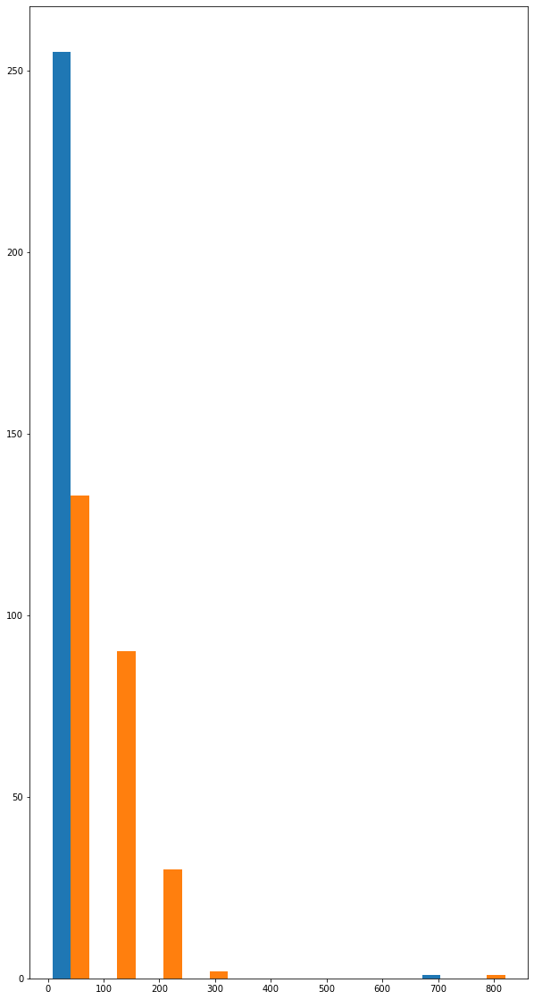

In [72]:
plt.hist(hist)

* Hostogram containing multiple tissue types will have severel peaks
* if your segmentation is look like a normal distribution this may be a good job because all of the other place is filled with blood

In [73]:

## finding varience of all the picture 
## vs some labels picture
# Variance for all pixels
var_all = ndi.variance(vol, labels=None, index=None)
print('All pixels:', var_all)

# Variance for labeled pixels
var_labels = ndi.variance(vol, labels, index=None)
print('Labeled pixels:', var_labels)

# Variance for each object
var_objects = ndi.variance(vol, labels, index=[1,2])
print('Left ventricle:', var_objects[0])

All pixels: 1024.5268017215453
Labeled pixels: 3028.0040823257095
Left ventricle: 4759.5383626916755


In [74]:
# Create histograms for selected pixels
hist1 = ndi.histogram(vol, min=0, max=255, bins=256)
hist2 = ndi.histogram(vol, 0, 255, 256, labels=labels)
hist3 = ndi.histogram(vol, 0, 255, 256, labels=labels, index=1)

(array([255.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([  0. ,  74.3, 148.6, 222.9, 297.2, 371.5, 445.8, 520.1, 594.4,
        668.7, 743. ]),
 <a list of 10 Patch objects>)

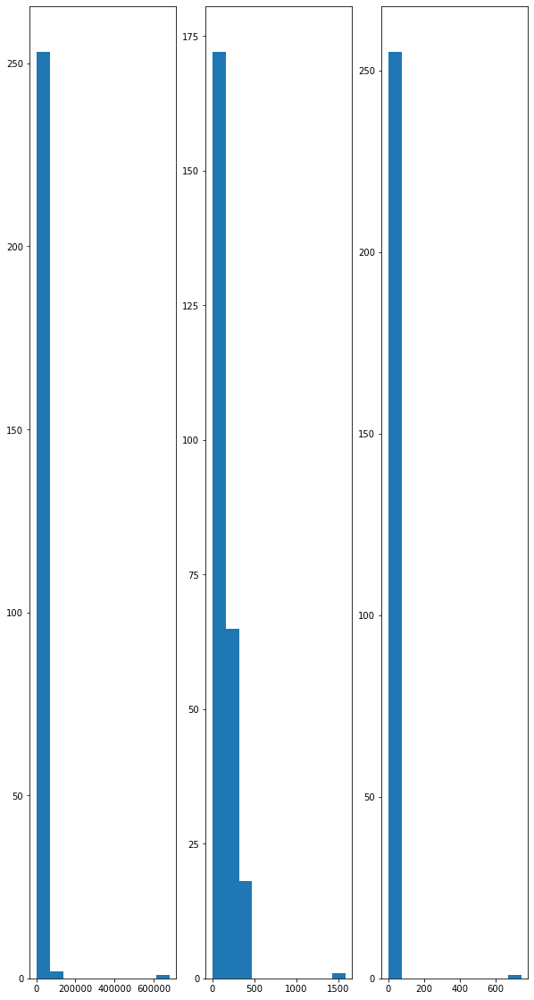

In [75]:
fig,axis = plt.subplots(nrows=1,ncols=3)
axis[0].hist(hist1)
axis[1].hist(hist2)
axis[2].hist(hist3)

# Measuring Shape and size volium (morphology)

to measure the ammount of object accupied by and object we need two quantities
## * space ocupied by each element
## * number of array element

In [76]:
## calculate the volume by multipleplying each voxel
## you can find it in the samppling in dicom images
d0,d1,d2 = vol.meta['sampling']
dvoxels = d0*d1*d2

In [77]:
## we want to count the number of vosxels in left ventricle
## this one is tricky
## first you assign the numebr 1 in the label and index 1 and then sum it that
## make the portion of the left ventricle
## then you mulltiply with the dvoxels thats how you find the volume of the portion
## volume of the portion = portion*total_volume
## nvoxels = ndi.sum(1,label,index=1)
## volume = nvoxels*dvoxels

# find the ejection fraction of a persons heart

***ejection fraction = (lv_max - lv_min )/(lv_max)***

Process
* first segment the left ventricle
* calculate the volume for a specfic time point sequentially that hold both the expand and squize part using a  for loop
* find the min and max 
* plug them in the formula
* remember data is 4d the first one is the time


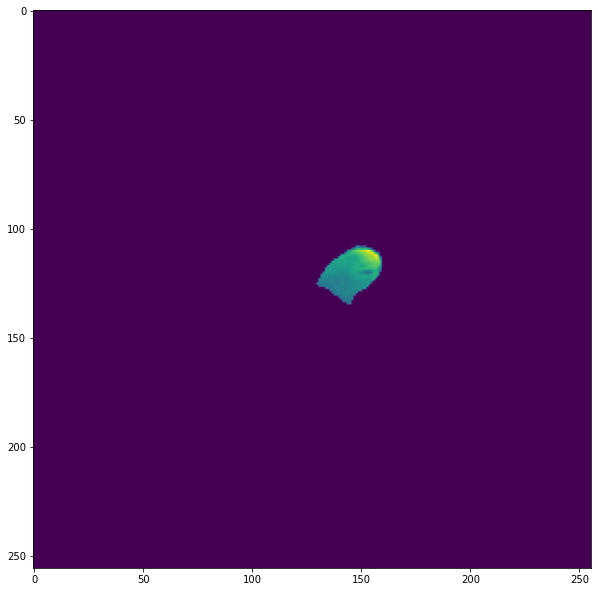

In [78]:
#1)
labels,nlabels = ndi.label(mask)
labels_of_the_left_vn=np.where(labels==3,im,0)
plt.imshow(labels_of_the_left_vn)

In [79]:
# 2)
## calculate the volum in mm^3 in a  specfic time point
d0,d1,d2 = vol.meta['sampling']
dvoxels = d0*d1*d2
## instantiate an empty list
ts = np.zeros(20)

## loop through the volume time series
for t in range(20):
    nvoxels = ndi.sum(1,labels_of_the_left_vn[t],index=3)
    ts[t] = nvoxels*dvoxels


In [80]:
#3)
tmax = np.argmax(ts)
tmin = np.argmin(ts)


In [81]:
#4)# Calculate ejection fraction
ej_vol = ts.max() - ts.min()
ej_frac = ej_vol / ts.max()
print('Est. ejection volume (mm^3):', ej_vol)
print('Est. ejection fraction:', ej_frac)

Est. ejection volume (mm^3): 0.0
Est. ejection fraction: nan


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


# all are called in combine **Affine transformation**
## * sifting image (it is called translation of image)
## * rotating image ( rotating image) 
## * scaling image (changing the size of the image)
## * shering changing axis ( chaning the axis of the image)

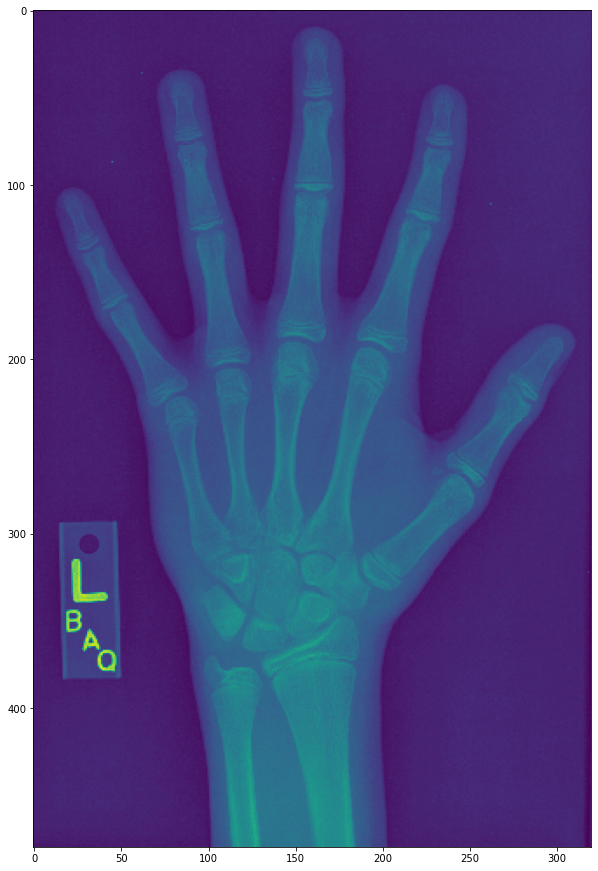

In [82]:
import imageio
import scipy.ndimage as ndi
im = imageio.imread('../input/hand.png')
plt.imshow(im)

In [83]:
## find the center of mass to rotate
com = ndi.center_of_mass(im)

In [84]:
print(com)

(261.60997853794845, 157.81893998955232)


In [85]:
## we set the target point
target = 128
## thenfor row and column we calculate the difference
d0 = target - com[0]
d2 = target - com[1]

In [86]:
## shift the image 
xfm = ndi.shift(im,shift=[d0,d1])

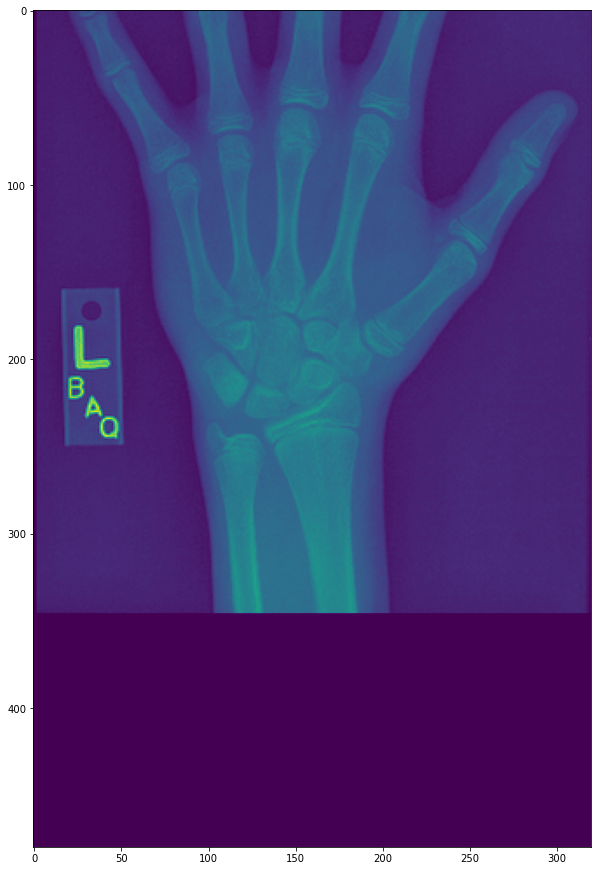

In [87]:
plt.imshow(xfm)

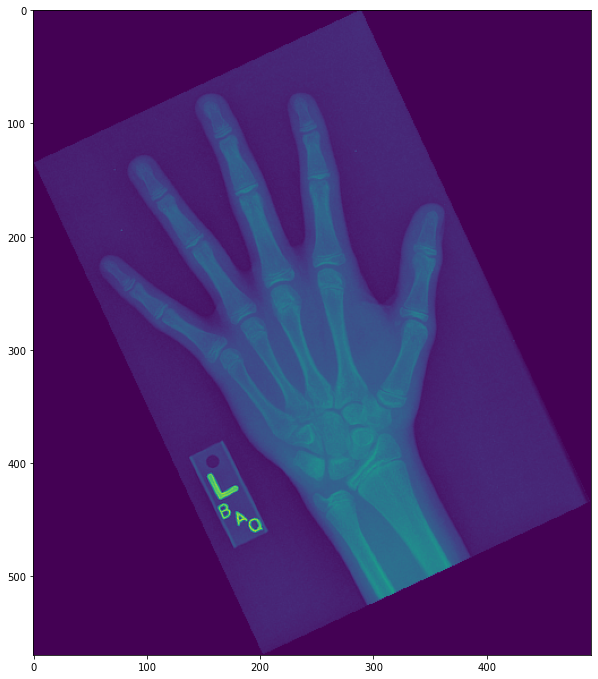

In [88]:
## rotate the imgae
plt.imshow(ndi.rotate(im,angle=25,axes=(0,1)))

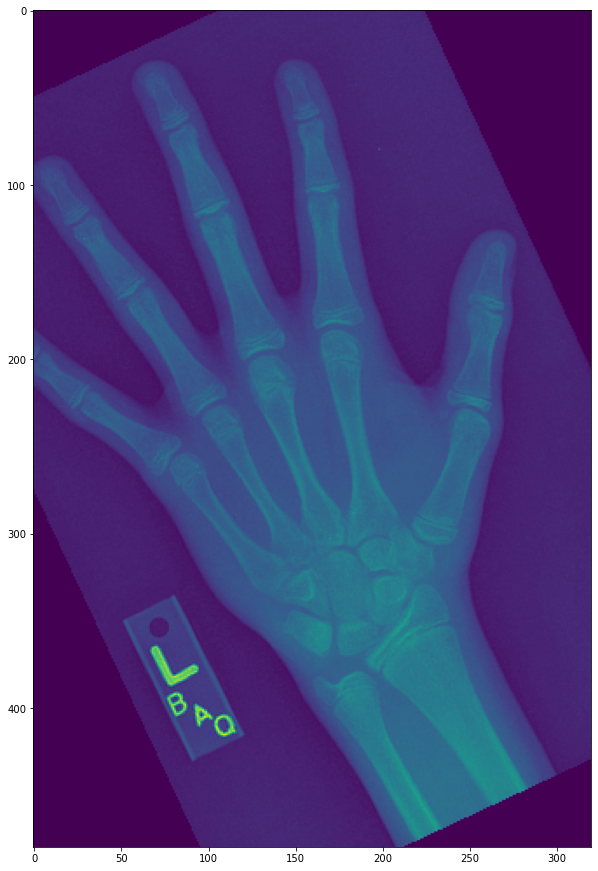

In [89]:
## rotate the imgae
plt.imshow(ndi.rotate(im,angle=25,axes=(0,1),reshape=False))

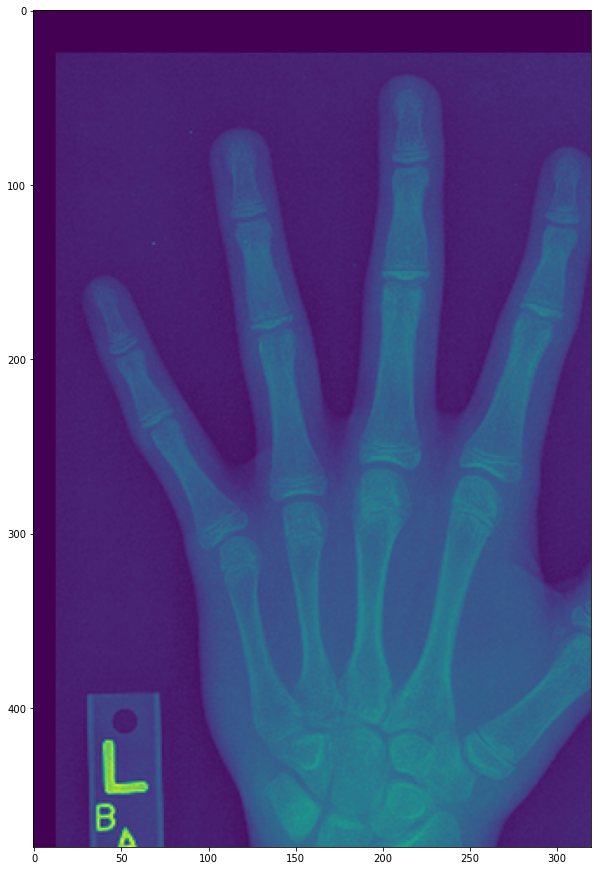

In [90]:
## resclaling image
mat = [[.8,0,-20],[0,.8,-10],[0,0,1]]
xfm = ndi.affine_transform(im,mat)
plt.imshow(xfm)

In [91]:
## resampling (slicing the imge ,changes the shape of the array )
## downsampling
## upsampling

## downsampling an image
information is merged accross multiple pixels to reduce the image zise

In [92]:
down_im = ndi.zoom(im,zoom=.5)

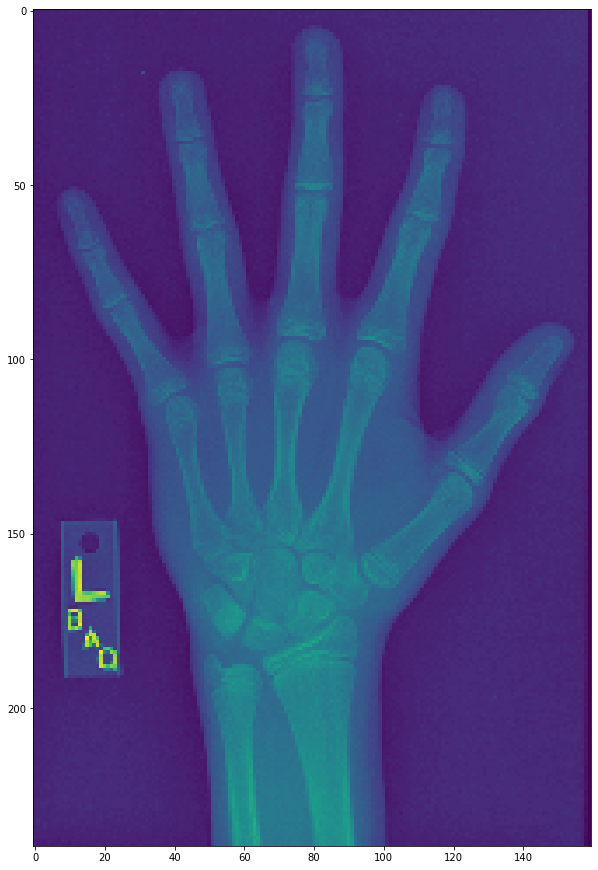

In [93]:
plt.imshow(down_im)

In [94]:
## the image is downsamopled and the quality is reduced 
## you can see the image scattered a little bit
print("shpe of image before downsampling {}".format(im.shape))
print("shpe of image after downsampling {}".format(down_im.shape))

shpe of image before downsampling (480, 320)
shpe of image after downsampling (240, 160)


In [95]:
## upsampling is not as same as downsampling
## you are not adding any feature 
## it just resample toa  larger grid
## some times it requires estimating some portionof the image that are not actually there
## like we do in image editing
## its called interpolation

## upsampling is not as same as downsampling
## you are not adding any feature 
## it just resample toa  larger grid
## some times it requires estimating some portionof the image that are not actually there
## like we do in image editing
## its called interpolation
# Interpolation (this is where the machine learning comes because you need to predict)
stiches togather the grid points to model the space between points

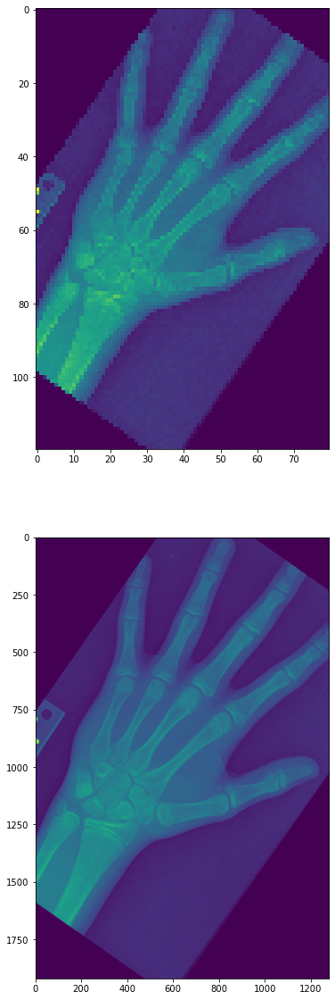

In [96]:
# Center and level image
xfm = ndi.shift(im, shift=(-20, -20))
xfm = ndi.rotate(xfm, angle=-35, reshape=False)

# Resample image
im_dn = ndi.zoom(xfm, zoom=0.25)
im_up = ndi.zoom(xfm, zoom=4.00)

# Plot the images
fig, axes = plt.subplots(2, 1)
axes[0].imshow(im_dn)
axes[1].imshow(im_up)


Original shape: (480, 320)
Upsampled shape: (1920, 1280)


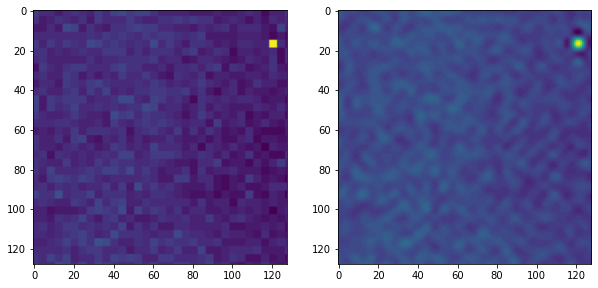

In [97]:
# Upsample "im" by a factor of 4
up0 = ndi.zoom(im, zoom=4, order=0)
up5 = ndi.zoom(im, zoom=4, order=5)

# Print original and new shape
print('Original shape:', im.shape)
print('Upsampled shape:', up0.shape)

# Plot close-ups of the new images
fig, axes = plt.subplots(1, 2)
axes[0].imshow(up0[128:256, 128:256])
axes[1].imshow(up5[128:256, 128:256])

# Comparing image
## and see where is the change happen

In [98]:
## we import two image
im1 = imageio.imread('../input/tcia-chest-ct-sample/chest-220.dcm')
im3 = imageio.imread('../input/tcia-chest-ct-sample/chest-222.dcm')

In [99]:
##find the difference
err = im1-im3

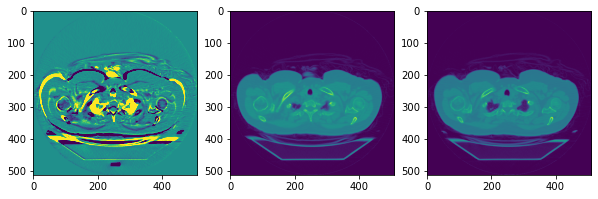

In [100]:
fig,axis = plt.subplots(nrows=1,ncols=3)
axis[0].imshow(err,vmin=-200,vmax=200)
axis[1].imshow(im1)
axis[2].imshow(im2)

In [101]:
## the difference are highlighted

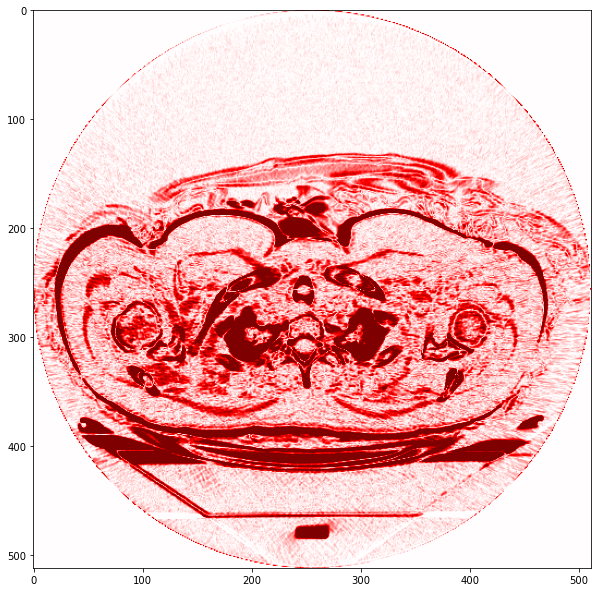

In [102]:
## if you want absolute image difference then add np.abs
# Calculate absolute image difference
abs_err = np.abs(im1 - im3)

# Plot the difference
plt.imshow(abs_err, cmap='seismic', vmin=-200, vmax=200)

In [103]:
## if you want to find MAE (mean absolute error)
# Calculate mean absolute error
mean_abs_err = np.mean(np.abs(im1 - im3))
print('MAE:', mean_abs_err)

MAE: 57.13523864746094


# normalizing data

In [104]:
import pandas as pd
df = pd.read_csv('../input/oasis_all_volumes.csv')

In [105]:
df.head()

,ID,age,sex,alzheimers,brain_vol,skull_vol,gray_matter_vol,white_matter_vol,csf_vol
0,OAS1_0001_MR1,74,F,False,807.935,1347.497879,470.698,337.237,57.058
1,OAS1_0002_MR1,55,F,False,808.760,1151.269287,450.571,358.189,9.478
2,OAS1_0003_MR1,73,F,True,860.255,1403.415054,492.974,367.281,46.159
3,OAS1_0004_MR1,28,M,False,1058.202,1593.284910,585.270,472.932,32.609
4,OAS1_0005_MR1,18,M,False,1263.391,1733.779281,732.734,530.657,14.887


In [106]:
# null hypothisis : men and women brain volume are equal
# we apply a t-test

In [107]:
male_brain_vol=df[df.sex=="M"][['brain_vol']]
female_brain_vol=df[df.sex=="F"][['brain_vol']]

In [108]:
from scipy.stats import ttest_ind
result = ttest_ind(male_brain_vol,female_brain_vol)

In [109]:
print(result)

Ttest_indResult(statistic=array([9.11002296]), pvalue=array([3.31524688e-18]))


In [110]:
## the large statistics and low p value means there are significant difference between gender brain size

In [111]:
## but the brain and the skull size are related and the skull size is related with the body
df[['brain_vol','skull_vol']].corr()

,brain_vol,skull_vol
brain_vol,1.000000,0.654829
skull_vol,0.654829,1.000000


In [112]:
df[['brain_vol','skull_vol']].corr()

,brain_vol,skull_vol
brain_vol,1.000000,0.654829
skull_vol,0.654829,1.000000


In [113]:
## so lets normalize the brain size with skull size thus we are comparing with the body size because
## skull size is related with the body sizee

In [114]:
df['brain_norm'] = df.brain_vol/df.skull_vol
male_brain_vol=df[df.sex=="M"][['brain_norm']]
female_brain_vol=df[df.sex=="F"][['brain_norm']]

In [115]:
from scipy.stats import ttest_ind
result = ttest_ind(male_brain_vol,female_brain_vol)

In [116]:
print(result)

Ttest_indResult(statistic=array([-0.994485]), pvalue=array([0.32055534]))


In [117]:
## now its telling different it was never dependent on the male or female
## its dependedn on the body size that means its related with other value too

In [118]:
## test the alzeimar with the brain vol
# Import independent two-sample t-test
from scipy.stats import ttest_ind

# Select data from "alzheimers" and "typical" groups
brain_alz = df.loc[df.alzheimers == True, 'brain_vol']
brain_typ = df.loc[df.alzheimers == False, 'brain_vol']

# Perform t-test of "alz" > "typ"
results = ttest_ind(brain_alz, brain_typ)
print('t = ', results.statistic)
print('p = ', results.pvalue)

t =  -10.270763061696771
p =  3.0435503446584287e-22


t =  -10.270763061696771
p =  3.0435503446584287e-22


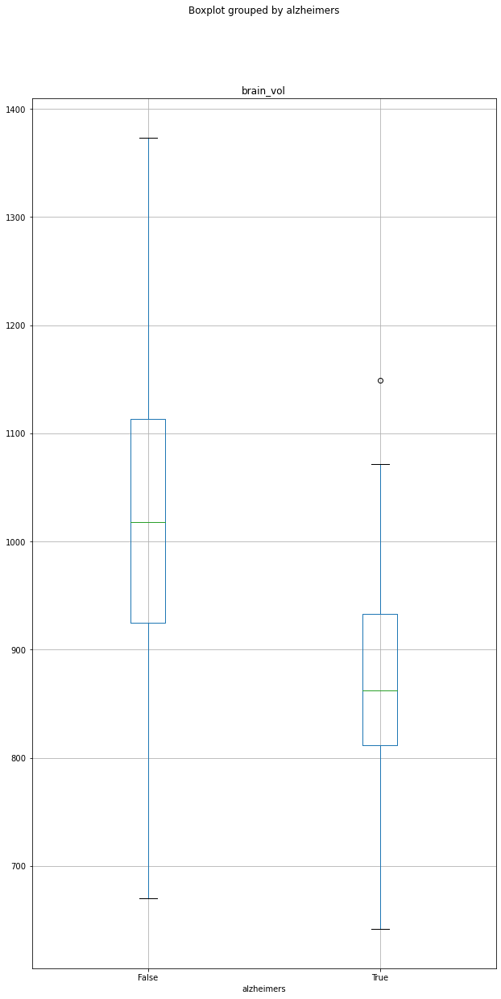

In [119]:
# Import independent two-sample t-test
from scipy.stats import ttest_ind

# Select data from "alzheimers" and "typical" groups
brain_alz = df.loc[df.alzheimers == True, 'brain_vol']
brain_typ = df.loc[df.alzheimers == False, 'brain_vol']

# Perform t-test of "alz" > "typ"
results = ttest_ind(brain_alz, brain_typ)
print('t = ', results.statistic)
print('p = ', results.pvalue)

# Show boxplot of brain_vol differences
df.boxplot(column='brain_vol', by='alzheimers')
plt.show()